## frathom
## Homework2 Part 1 and Part 2

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torchvision
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np
from google.colab import drive
import helper
from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils.data import TensorDataset
import glob
import librosa
import math

In [2]:
import IPython.display as ipd

In [3]:

if torch.cuda.is_available():
  device = torch.device("cuda")
else:
  device = torch.device("cpu")

In [4]:
print(torch.cuda.is_available())

True


In [5]:
#### Part 1

In [6]:
from google.colab import files
uploaded = files.upload()

Saving test_x_01.wav to test_x_01.wav
Saving test_x_02.wav to test_x_02.wav
Saving train_clean_male.wav to train_clean_male.wav
Saving train_dirty_male.wav to train_dirty_male.wav


In [7]:
clean, srate=librosa.load('train_clean_male.wav', sr=None)
S_st=librosa.stft(clean, n_fft=1024, hop_length=512)
noisy, srate=librosa.load('train_dirty_male.wav', sr=None)
X_st=librosa.stft(noisy, n_fft=1024, hop_length=512)

In [8]:
S_st.shape

(513, 2459)

In [9]:
S_abs=np.abs(S_st)
X_abs=np.abs(X_st)

In [10]:
S= torch.tensor(np.transpose(S_abs)).cuda()
X = torch.tensor(np.transpose(X_abs)).cuda()

In [11]:
class CNN_problem1(nn.Module):
  def __init__(self):
    super(CNN_problem1,self).__init__()
    self.first_conv=nn.Conv1d(1,10,kernel_size=5,stride=1)
    nn.init.xavier_normal_(self.first_conv.weight)
    self.relu=nn.ReLU()
    self.pooling=nn.AvgPool1d(kernel_size=2,stride=2)
    self.second_conv=nn.Conv1d(10,10,kernel_size=5,stride=1)
    nn.init.xavier_normal_(self.second_conv.weight)
    self.fc1=nn.Linear(125*10,900)
    nn.init.xavier_normal_(self.fc1.weight)
    self.fc2=nn.Linear(900,513)
    nn.init.xavier_normal_(self.fc2.weight)
  
  def Forward_prop(self,x):
    x = x[:, np.newaxis,:]
    x1=self.pooling(self.relu(self.first_conv(x)))
    x2=self.pooling(self.relu(self.second_conv(x1)))
    x2=x2.reshape(x2.shape[0],-1)
    x3=self.relu(self.fc1(x2))
    out=self.relu(self.fc2(x3))
    return out

In [12]:
cnn_model1=CNN_problem1().cuda()

In [13]:
loss=nn.MSELoss()
param=cnn_model1.parameters()
optimize=torch.optim.Adam(param,lr=0.001)
batch_num=500

In [14]:
def train_model():
  for i in range(0,len(X),batch_num):
    X_batch=X[i:i+batch_num]
    S_batch=S[i:i+batch_num]
    ff_out=cnn_model1.Forward_prop(X_batch.cuda())
    optimize.zero_grad()
    losses=loss(ff_out,S_batch.cuda())
    losses.backward()
    optimize.step()
  return losses.data

In [15]:
training_loss=[]
for i in range(600):
  tr_l=train_model()
  training_loss.append(tr_l)
  print("epoch {} is done".format(i))

epoch 0 is done
epoch 1 is done
epoch 2 is done
epoch 3 is done
epoch 4 is done
epoch 5 is done
epoch 6 is done
epoch 7 is done
epoch 8 is done
epoch 9 is done
epoch 10 is done
epoch 11 is done
epoch 12 is done
epoch 13 is done
epoch 14 is done
epoch 15 is done
epoch 16 is done
epoch 17 is done
epoch 18 is done
epoch 19 is done
epoch 20 is done
epoch 21 is done
epoch 22 is done
epoch 23 is done
epoch 24 is done
epoch 25 is done
epoch 26 is done
epoch 27 is done
epoch 28 is done
epoch 29 is done
epoch 30 is done
epoch 31 is done
epoch 32 is done
epoch 33 is done
epoch 34 is done
epoch 35 is done
epoch 36 is done
epoch 37 is done
epoch 38 is done
epoch 39 is done
epoch 40 is done
epoch 41 is done
epoch 42 is done
epoch 43 is done
epoch 44 is done
epoch 45 is done
epoch 46 is done
epoch 47 is done
epoch 48 is done
epoch 49 is done
epoch 50 is done
epoch 51 is done
epoch 52 is done
epoch 53 is done
epoch 54 is done
epoch 55 is done
epoch 56 is done
epoch 57 is done
epoch 58 is done
epoch 5

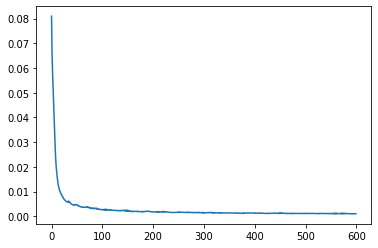

In [16]:
plt.plot(list(range(600)),training_loss)

In [17]:
s, sr=librosa.load('test_x_01.wav', sr=None)
X_t1=librosa.stft(s, n_fft=1024, hop_length=512)
xt1=librosa.stft(s, n_fft=1024, hop_length=512)
sa, sr=librosa.load('test_x_02.wav', sr=None)
X_t2=librosa.stft(sa, n_fft=1024, hop_length=512)
xt2=librosa.stft(sa, n_fft=1024, hop_length=512)

In [18]:
def test_model(x):
  with torch.no_grad():
    out=cnn_model1.Forward_prop(x)
  return out

In [19]:
def reconstruct(x,o_inp):
  test_out=test_model(x)
  test_out=test_out.cpu().numpy()
  x_den=x.cpu().numpy()
  S_hat=(o_inp.T/x_den)*test_out
  return S_hat

In [20]:
X_t1=np.abs(X_t1)
X_t1= torch.tensor(np.transpose(X_t1)).cuda()

In [21]:
X_t2=np.abs(X_t2)
X_t2= torch.tensor(np.transpose(X_t2)).cuda()

In [22]:
s1=reconstruct(X_t1,xt1)

In [23]:
s2=reconstruct(X_t2,xt2)

In [24]:
s1_re=librosa.istft(s1.T,hop_length=512,length =len(s))
s2_re=librosa.istft(s2.T,hop_length=512,length =len(sa))

In [25]:
librosa.output.write_wav('test_s_01_recons.wav', s1_re, sr)
librosa.output.write_wav('test_s_02_recons.wav', s2_re, sr)

In [26]:
train_n=reconstruct(X,X_st)

In [27]:
train_re=librosa.istft(train_n.T,hop_length=512,length =len(noisy))

In [28]:
librosa.output.write_wav('train_recons.wav', train_re, srate)

In [29]:
ipd.Audio('train_recons.wav') # reconstructed train signal

In [30]:
ipd.Audio('test_s_01_recons.wav') # reconstructed test 1 signal

In [31]:
ipd.Audio('test_s_02_recons.wav') # The reconstructed test 2 signal

In [32]:
def SNR(cs, ds):
  cs,sr=librosa.load(cs, sr=None)
  ds,sr=librosa.load(ds, sr=None)
  A=np.dot(cs, cs.T)
  B=np.dot(cs-ds,(cs-ds).T)
  s=A/B
  snr=10*(np.log10(s))  
  return snr

In [33]:

SNR('train_dirty_male.wav', 'train_recons.wav')

7.55933940410614

Some formulae used:

1. To recover signal:

\begin{equation}
\hat{S}=\frac{\boldsymbol{X}_{\text {test}}}{\left|\boldsymbol{X}_{\text {test}}\right|} \odot\left|\hat{\boldsymbol{S}}_{\text {test}}\right|
\end{equation}

2. To calculate SNR:

\begin{equation}
\mathrm{SNR}=10 \log _{10} \frac{\sum_{t}(s(t))^{2}}{\sum_{t}(s(t)-\hat{s}(t))^{2}}
\end{equation}

#### Part 2

In [34]:
from google.colab import files
uploaded = files.upload()

Saving test_x_01.wav to test_x_01 (1).wav
Saving test_x_02.wav to test_x_02 (1).wav
Saving train_clean_male.wav to train_clean_male (1).wav
Saving train_dirty_male.wav to train_dirty_male (1).wav


In [35]:
clean, srate=librosa.load('train_clean_male.wav', sr=None)
S_st=librosa.stft(clean, n_fft=1024, hop_length=512)
noisy, srate=librosa.load('train_dirty_male.wav', sr=None)
X_st=librosa.stft(noisy, n_fft=1024, hop_length=512)

In [36]:
S_abs=np.abs(S_st)
X_abs=np.abs(X_st)

In [37]:
# S= torch.tensor(np.transpose(S_abs)).cuda()
# X = torch.tensor(np.transpose(X_abs)).cuda()

In [38]:
def frames_creation(inp):
  out=[]
  length=inp.shape[0]-19
  for i in range(0,length):
    s_f=inp[i:i+20,:]
    out.append(s_f)
  return np.array(out)



In [39]:
S_frame=torch.tensor(frames_creation(np.transpose(S_abs))).cuda()
X_frame=torch.tensor(frames_creation(np.transpose(X_abs))).cuda()

In [40]:
S_frame.shape

torch.Size([2440, 20, 513])

In [41]:
X_frame.shape

torch.Size([2440, 20, 513])

In [42]:
class CNN_problem2(nn.Module):
  def __init__(self):
    super(CNN_problem2,self).__init__()
    self.first_conv=nn.Conv2d(1,10,kernel_size=5,stride=1)
    nn.init.xavier_normal_(self.first_conv.weight)
    self.relu=nn.ReLU()
    self.pooling=nn.AvgPool2d(kernel_size=2,stride=2)
    self.second_conv=nn.Conv2d(10,20,kernel_size=5,stride=1)
    nn.init.xavier_normal_(self.second_conv.weight)
    self.fc1=nn.Linear(125*20*2,900)
    nn.init.xavier_normal_(self.fc1.weight)
    self.fc2=nn.Linear(900,513)
    nn.init.xavier_normal_(self.fc2.weight)
  
  def Forward_prop(self,x):
    x = x[:, np.newaxis,:]
    x1=self.pooling(self.relu(self.first_conv(x)))
    x2=self.pooling(self.relu(self.second_conv(x1)))
    x2=x2.reshape(x2.shape[0],-1)
    x3=self.relu(self.fc1(x2))
    out=self.relu(self.fc2(x3))
    return out

In [43]:
cnn_model2=CNN_problem2().cuda()

In [44]:
loss=nn.MSELoss()
param=cnn_model2.parameters()
optimize=torch.optim.Adam(param,lr=0.001)
batch_num=500

In [45]:
def train_model():
  for i in range(0,len(X_frame),batch_num):
    X_batch=X_frame[i:i+batch_num,:,:]
    S_batch=S_frame[i:i+batch_num,:,:]
    ff_out=cnn_model2.Forward_prop(X_batch.cuda())
    optimize.zero_grad()
    losses=loss(ff_out,S_batch[:,19,:].cuda())
    losses.backward()
    optimize.step()
  return losses.data

In [46]:
training_loss=[]
for i in range(600):
  tr_l=train_model()
  training_loss.append(tr_l)
  print("epoch {} is done".format(i))

epoch 0 is done
epoch 1 is done
epoch 2 is done
epoch 3 is done
epoch 4 is done
epoch 5 is done
epoch 6 is done
epoch 7 is done
epoch 8 is done
epoch 9 is done
epoch 10 is done
epoch 11 is done
epoch 12 is done
epoch 13 is done
epoch 14 is done
epoch 15 is done
epoch 16 is done
epoch 17 is done
epoch 18 is done
epoch 19 is done
epoch 20 is done
epoch 21 is done
epoch 22 is done
epoch 23 is done
epoch 24 is done
epoch 25 is done
epoch 26 is done
epoch 27 is done
epoch 28 is done
epoch 29 is done
epoch 30 is done
epoch 31 is done
epoch 32 is done
epoch 33 is done
epoch 34 is done
epoch 35 is done
epoch 36 is done
epoch 37 is done
epoch 38 is done
epoch 39 is done
epoch 40 is done
epoch 41 is done
epoch 42 is done
epoch 43 is done
epoch 44 is done
epoch 45 is done
epoch 46 is done
epoch 47 is done
epoch 48 is done
epoch 49 is done
epoch 50 is done
epoch 51 is done
epoch 52 is done
epoch 53 is done
epoch 54 is done
epoch 55 is done
epoch 56 is done
epoch 57 is done
epoch 58 is done
epoch 5

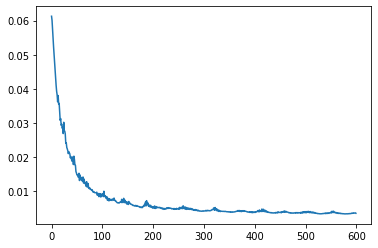

In [47]:
plt.plot(list(range(600)),training_loss)

In [48]:
s, sr=librosa.load('test_x_01.wav', sr=None)
X_t1=librosa.stft(s, n_fft=1024, hop_length=512)
xt1=librosa.stft(s, n_fft=1024, hop_length=512)
sa, sr=librosa.load('test_x_02.wav', sr=None)
X_t2=librosa.stft(sa, n_fft=1024, hop_length=512)
xt2=librosa.stft(sa, n_fft=1024, hop_length=512)

In [49]:
def test_model(x):
  with torch.no_grad():
    out=cnn_model2.Forward_prop(x)
  return out

In [50]:
#reconstruction

def rec(dirty):
  sig,srate=librosa.load(dirty,sr=None)
  di=librosa.stft(sig, n_fft=1024, hop_length=512)
  di_abs=np.abs(di)
  di_t=torch.tensor(frames_creation(np.transpose(di_abs))).cuda()
  di_out=test_model(di_t)
  fill=[0 for i in range(513)]
  si_f=np.array([fill]*19)
  recons_in=np.concatenate((si_f,di_out.cpu().numpy()))
  recons=(di.T/np.abs(di.T))*recons_in
  recr_sig=librosa.istft(recons.T, hop_length=512, length =len(sig))
  return recr_sig


In [51]:
train=rec('train_dirty_male.wav')

In [52]:
librosa.output.write_wav('train_recons.wav', train, srate)

In [53]:
ipd.Audio('train_recons.wav')

In [54]:
test1=rec('test_x_01.wav')

In [55]:
librosa.output.write_wav('test1_recons.wav', test1, sr)

In [56]:
ipd.Audio('test1_recons.wav')

In [57]:
test2=rec('test_x_02.wav')

In [58]:
librosa.output.write_wav('test2_recons.wav', test2, sr)

In [59]:
ipd.Audio('test2_recons.wav')

In [60]:
def SNR(cs, ds):
  cs,sr=librosa.load(cs, sr=None)
  ds,sr=librosa.load(ds, sr=None)
  A=np.dot(cs, cs.T)
  B=np.dot(cs-ds,(cs-ds).T)
  s=A/B
  snr=10*(math.log10(s))  
  return snr

In [61]:

SNR('train_dirty_male.wav', 'train_recons.wav')

6.927975027252038

Some formulae used:

1. First input 'Image'

\begin{equation}
\left|\boldsymbol{S}_{:, t+19}^{\top}\right| \approx \mathcal{F}_{\mathrm{CNN}}\left(\left|\boldsymbol{X}_{:, t: t+19}^{\top}\right|\right)
\end{equation}

2. Second input 'Image'(shifted by a frame)

\begin{equation}
\left|\boldsymbol{S}_{:, t+20}^{\top}\right| \approx \mathcal{F}_{\mathrm{CNN}}\left(\left|\boldsymbol{X}_{:, t+1: t+20}^{\top}\right|\right)
\end{equation}

3. SNR Calculation is the same


